In [2]:
import numpy as np
from PIL import Image
from PIL import ImageFilter
from PIL import ImageOps
import matplotlib.pyplot as plt
from scipy import ndimage
import cv2
import math


lena_img = Image.open(r'..\images\lena_gray_512.tif')
cam_img = Image.open(r'..\images\cameraman.tif')
house_img = Image.open(r'..\images\house.tif')

lena_cv = cv2.imread(r'..\images\lena_gray_512.tif')
cam_cv = cv2.imread(r'..\images\cameraman.tif')
house_cv = cv2.imread(r'..\images\house.tif')

lena = np.array(lena_img)
cam = np.array(cam_img)
house = np.array(house_img)

## OPERAÇÃO PONTO A PONTO:


### 1. Calcular o negativo das imagens

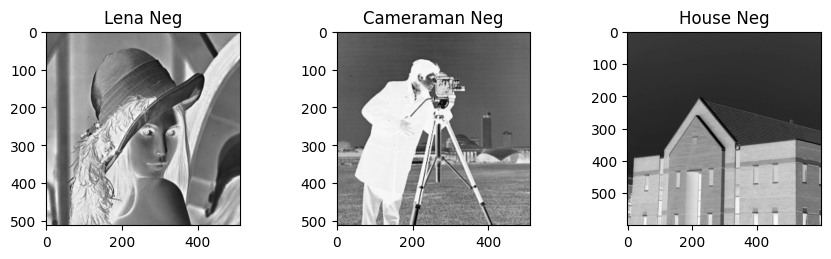

In [ ]:
npLenaNegative = lena
npLenaNegative = 255 - npLenaNegative

npCamNegative = cam
npCamNegative = 255 - npCamNegative

npHouseNegative = house
npHouseNegative = 255 - npHouseNegative

fig = plt.figure(figsize=(10, 5))
plt1 = plt.subplot(1, 3, 1)
plt2 = plt.subplot(1, 3, 2)
plt3 = plt.subplot(1, 3, 3)
plt1.title.set_text("Lena Neg")
plt2.title.set_text("Cameraman Neg")
plt3.title.set_text("House Neg")
plt.subplots_adjust(wspace=0.5)

plt1.imshow(npLenaNegative, cmap="gray")
plt2.imshow(npCamNegative, cmap="gray")
plt3.imshow(npHouseNegative, cmap="gray")

### 2. Diminuir pela metade a intensidade dos pixels

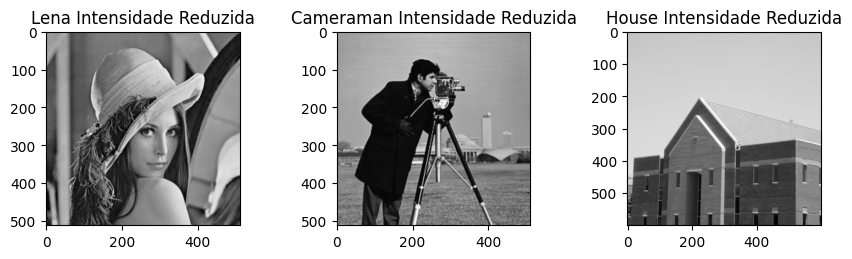

In [ ]:
npLenaPixelImage =  (lena / 2).astype(int)
npCamPixelImage =  (cam / 2).astype(int)
npHousePixelImage =  (house / 2).astype(int)

fig = plt.figure(figsize=(10, 5))
plt1 = plt.subplot(1, 3, 1)
plt2 = plt.subplot(1, 3, 2)
plt3 = plt.subplot(1, 3, 3)
plt1.title.set_text("Lena Intensidade Reduzida")
plt2.title.set_text("Cameraman Intensidade Reduzida")
plt3.title.set_text("House Intensidade Reduzida")
plt.subplots_adjust(wspace=0.5)

plt1.imshow(npLenaPixelImage, cmap="gray")
plt2.imshow(npCamPixelImage, cmap="gray")
plt3.imshow(npHousePixelImage, cmap="gray")


### 3. Incluir 4 quadrados brancos 10 x 10 pixels em cada canto das imagens


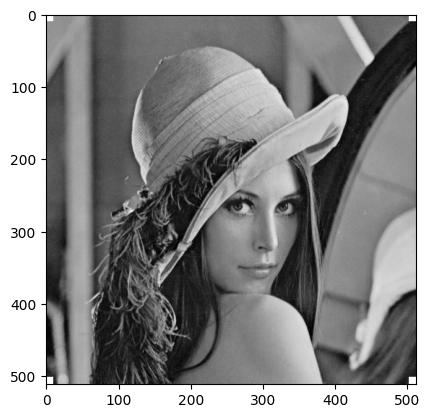

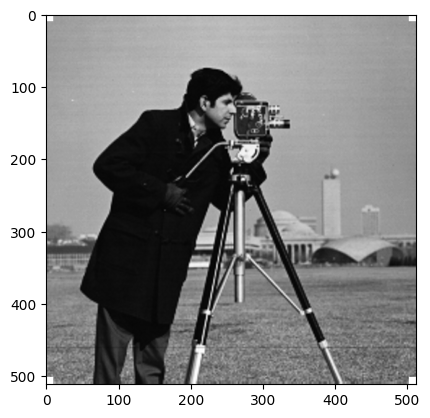

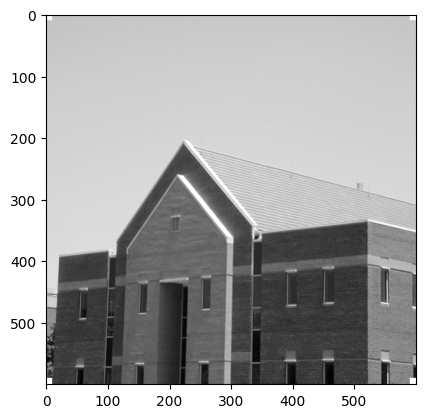

In [6]:
sizeLena = lena.shape[0]
lenaCQuadrado = lena.copy()
lenaCQuadrado[0:10, 0:10] = 255
lenaCQuadrado[0:10, sizeLena-10:sizeLena] = 255 
lenaCQuadrado[sizeLena-10:sizeLena, 0:10] = 255
lenaCQuadrado[sizeLena-10:sizeLena,sizeLena-10:sizeLena] = 255
plt.imshow(lenaCQuadrado, cmap="gray")
plt.show()

sizeCam = cam.shape[0]
CamCQuadrado = cam.copy()
CamCQuadrado[0:10, 0:10] = CamCQuadrado[0:10, sizeCam-10:sizeCam] = 255 
CamCQuadrado[sizeCam-10:sizeCam, 0:10] = CamCQuadrado[sizeCam-10:sizeCam,sizeCam-10:sizeCam] = 255
plt.imshow(CamCQuadrado, cmap="gray")
plt.show()

sizeHouse = house.shape[0]
HouseCQuadrado = house.copy()
HouseCQuadrado[0:10, 0:10] = HouseCQuadrado[0:10, sizeHouse-10:sizeHouse] = 255
HouseCQuadrado[sizeHouse-10:sizeHouse, 0:10] = HouseCQuadrado[sizeHouse-10:sizeHouse,sizeHouse-10:sizeHouse] = 255
plt.imshow(HouseCQuadrado, cmap="gray")
plt.show()


#### 4. Incluir 1 quadrado preto 15X15 no centro das imagens

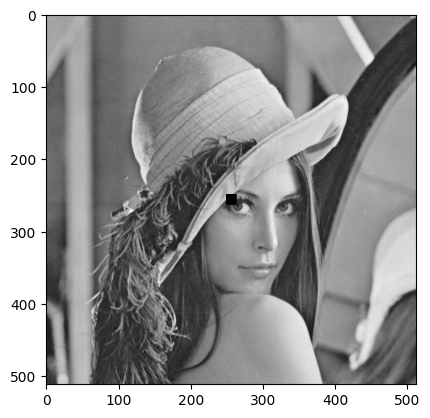

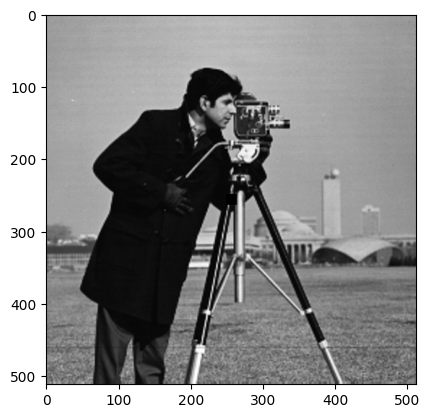

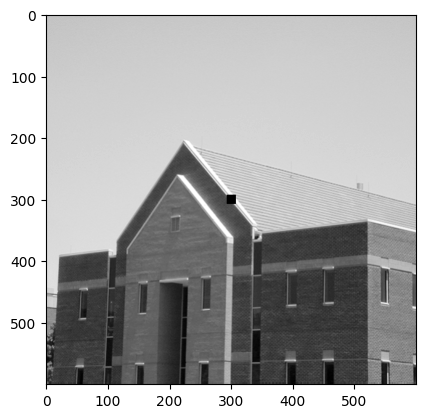

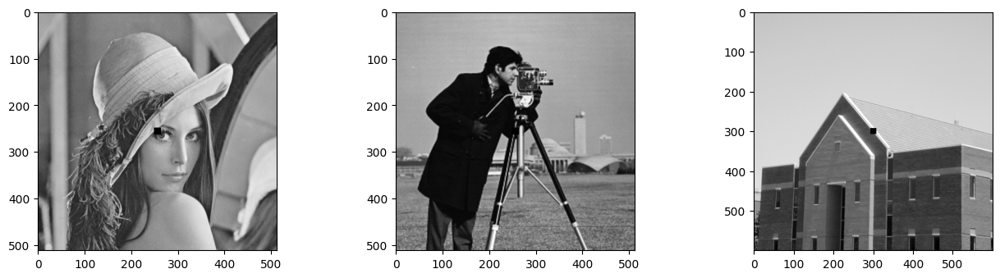

In [5]:
lenaCQuadradoPreto = lena.copy()
centro = int(sizeLena/2)
lenaCQuadradoPreto[centro-7:centro+8,centro-7:centro+8] = 0
plt.imshow(lenaCQuadradoPreto, cmap="gray")
plt.show()

camCQuadradoPreto = cam.copy()
centro = int(sizeCam/2)
camCQuadradoPreto[centro-7:centro+8,centro-7:centro+8] = 0
plt.imshow(camCQuadradoPreto, cmap="gray")
plt.show()

houseCQuadradoPreto = house.copy()
centro = int(sizeHouse/2)
houseCQuadradoPreto[centro-7:centro+8,centro-7:centro+8] = 0
plt.imshow(houseCQuadradoPreto, cmap="gray")
plt.show()

fig = plt.figure(figsize=(15, 5))
plt1 = plt.subplot(1, 3, 1)
plt2 = plt.subplot(1, 3, 2)
plt3 = plt.subplot(1, 3, 3)
plt.subplots_adjust(wspace=0.5)
plt1.imshow(lenaCQuadradoPreto, cmap="gray")
plt2.imshow(camCQuadradoPreto, cmap="gray")
plt3.imshow(houseCQuadradoPreto, cmap="gray")

## OPERAÇÃO POR VIZINHANÇA:  Utilizar kernel 3x3 pixels e desconsiderar pixels das extremidades. Para cada filtro implementar utilizando apenas numpy, utilizando pillow, utilizando opencv e utilizando scipy.

### 1. Calcular o filtro da média

##### 1.1 Numpy

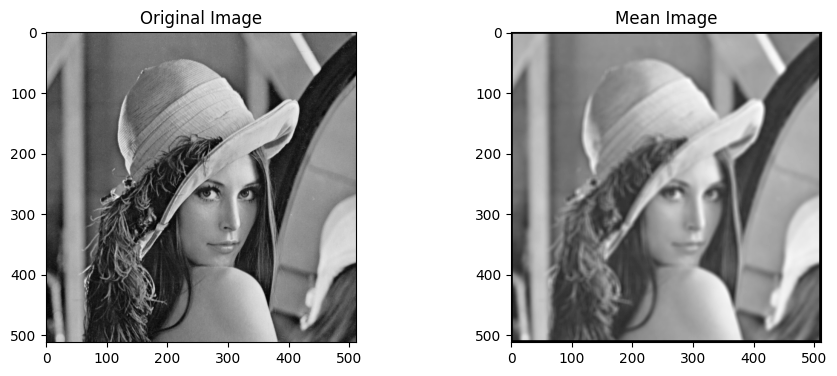

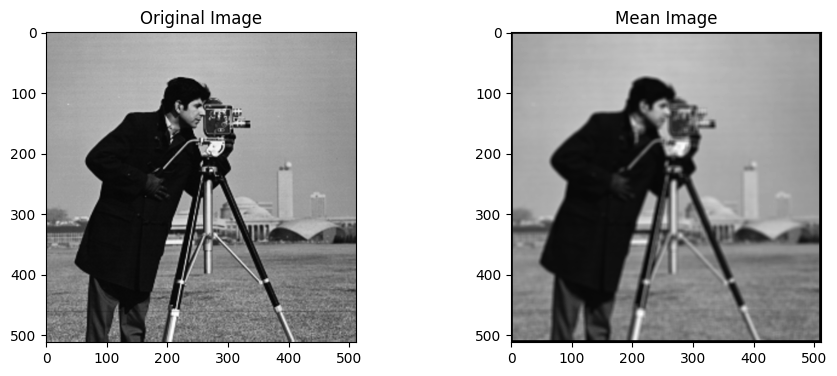

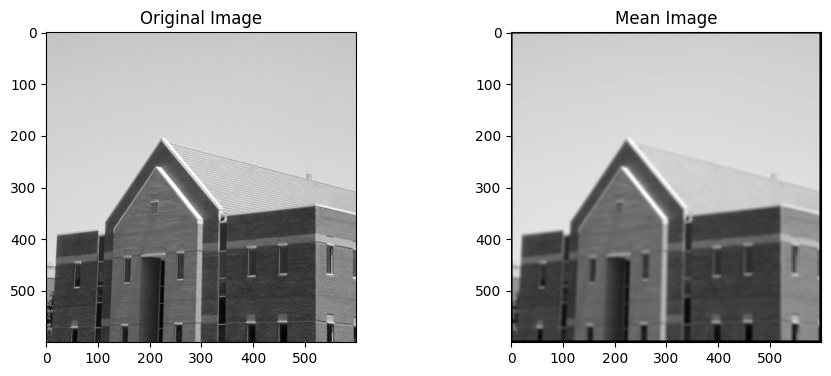

In [ ]:
def show_mean(img, g2_im_nd):
    fig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 2, 1)
    plt2 = plt.subplot(1, 2, 2)
    plt1.title.set_text("Original Image")
    plt2.title.set_text("Mean Image")
    plt.subplots_adjust(wspace=0.5)

    plt1.imshow(img, cmap="gray")
    plt2.imshow(g2_im_nd, cmap="gray")

def mean(img):
    g2_im_nd = np.zeros(img.shape)
    
    # Neighborhood opperation (Operação por vizinhança)
    lines = img.shape[0]
    columns = img.shape[1]
    kernel_size = 3 
    
    for x in range(kernel_size, lines - kernel_size):
        for y in range(kernel_size, columns - kernel_size):
            s_xy = img[x-kernel_size:x+kernel_size+1, y-kernel_size:y+kernel_size+1]
            g2_im_nd[x,y] = np.mean(s_xy).astype(int)
    
    # Create two colums plot
    show_mean(img, g2_im_nd)
    

mean(lena.copy())

mean(cam.copy())

mean(house.copy())

#### 1.2 Pillow

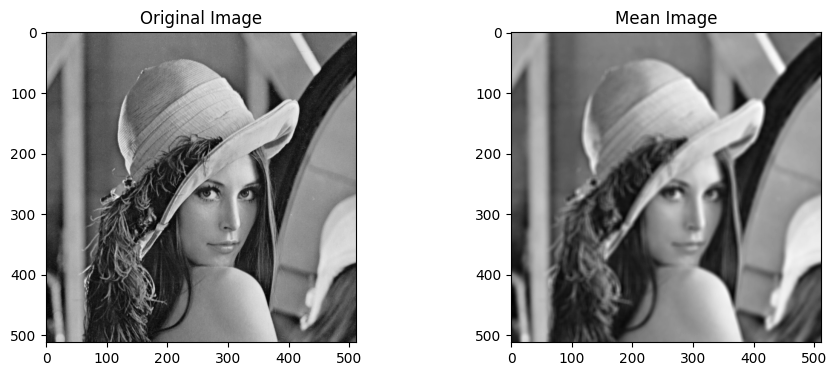

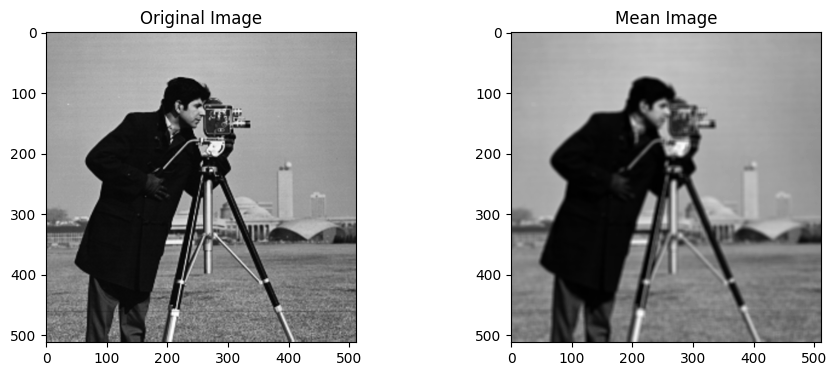

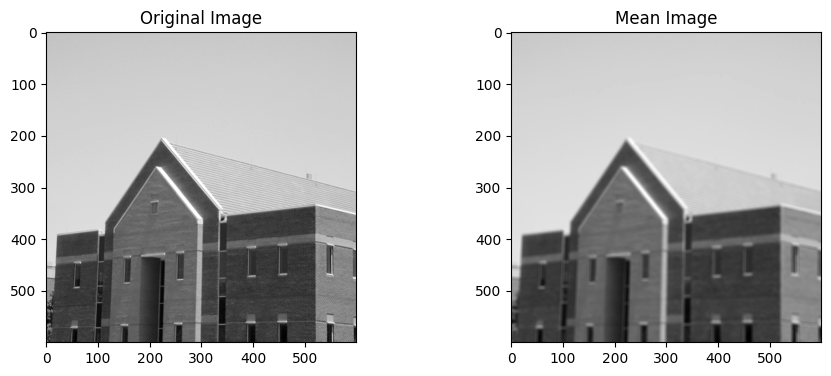

In [ ]:
lena_mean = lena_img.copy()
lena_mean = lena_mean.filter(ImageFilter.BoxBlur(3))

cam_mean = cam_img.copy()
cam_mean = cam_mean.filter(ImageFilter.BoxBlur(3))

house_mean = house_img.copy()
house_mean = house_mean.filter(ImageFilter.BoxBlur(3))

show_mean(lena_img, lena_mean)
show_mean(cam_img, cam_mean)
show_mean(house_img, house_mean)

#### 1.3 OpenCv

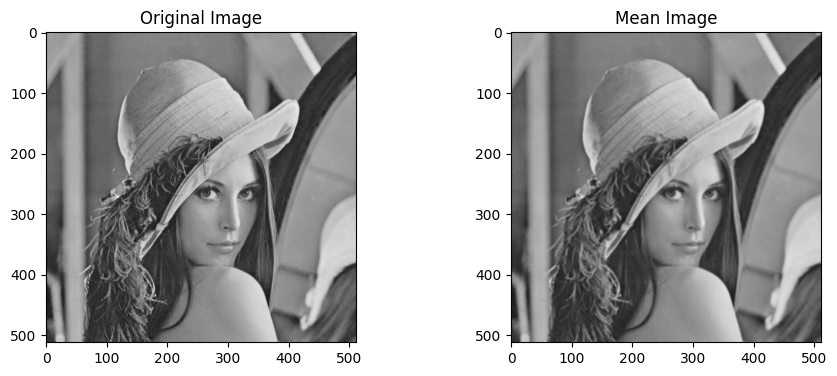

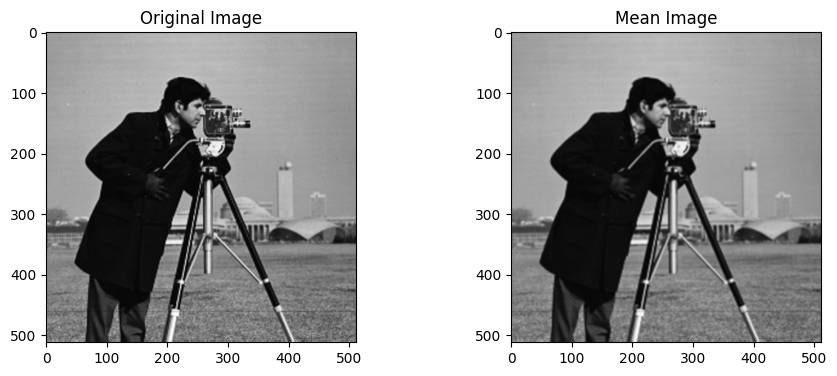

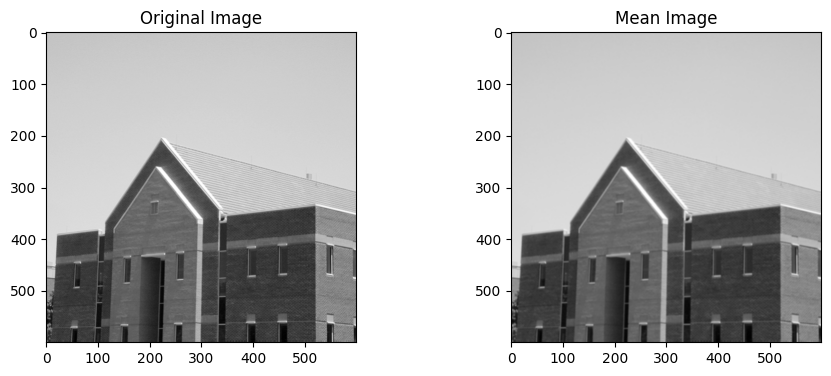

In [ ]:
lena_mean = lena_cv.copy()
lena_mean = cv2.blur(lena_mean, (3,3))

cam_mean = cam_cv.copy()
cam_mean = cv2.blur(cam_mean, (3,3))

house_mean = house_cv.copy()
house_mean = cv2.blur(house_mean, (3,3))

show_mean(lena_cv, lena_mean)
show_mean(cam_cv, cam_mean)
show_mean(house_cv, house_mean)

#### 1.4 Scipy

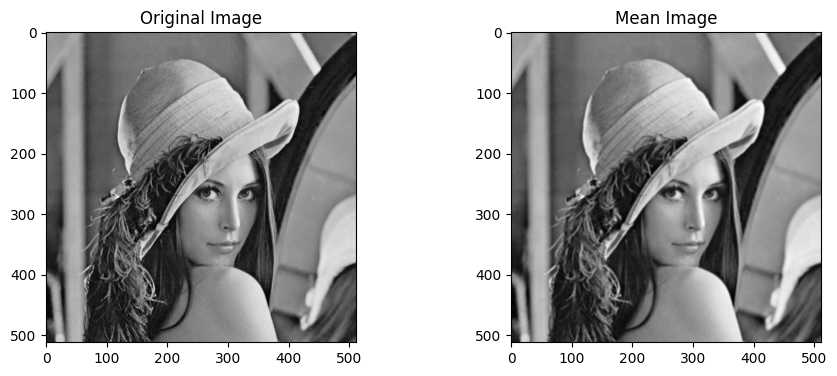

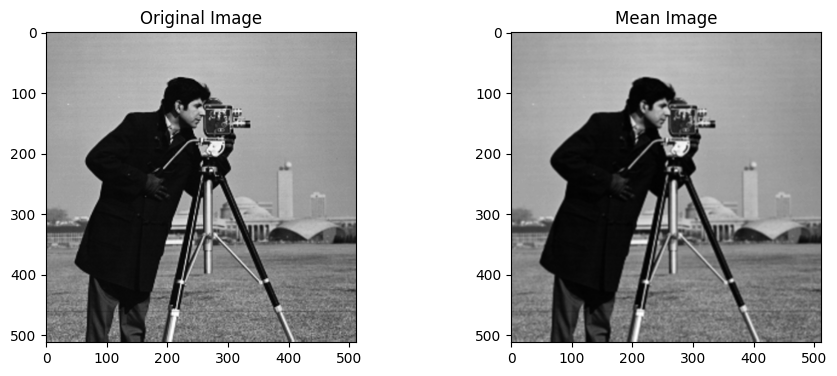

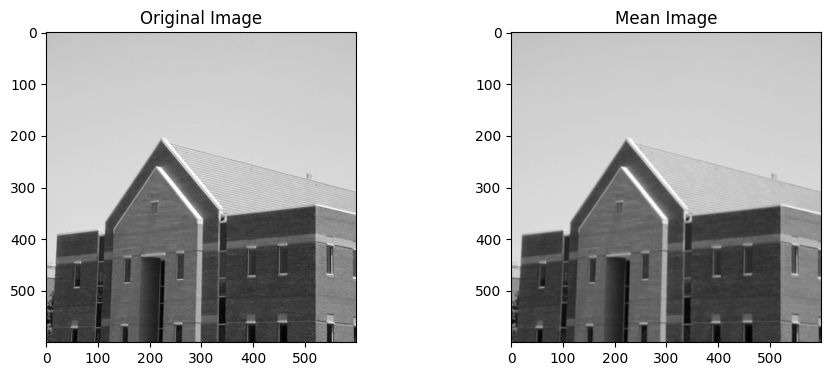

In [ ]:
lena_mean = ndimage.uniform_filter(lena, size=3)

cam_mean = ndimage.uniform_filter(cam, size=3)

house_mean = ndimage.uniform_filter(house, size=3)

show_mean(lena, lena_mean)
show_mean(cam, cam_mean)
show_mean(house, house_mean)



### 2. Calcular o filtro da mediana

#### 2.1 Numpy

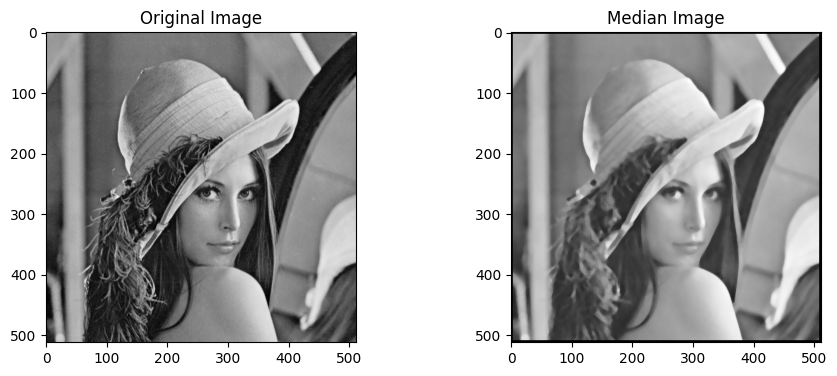

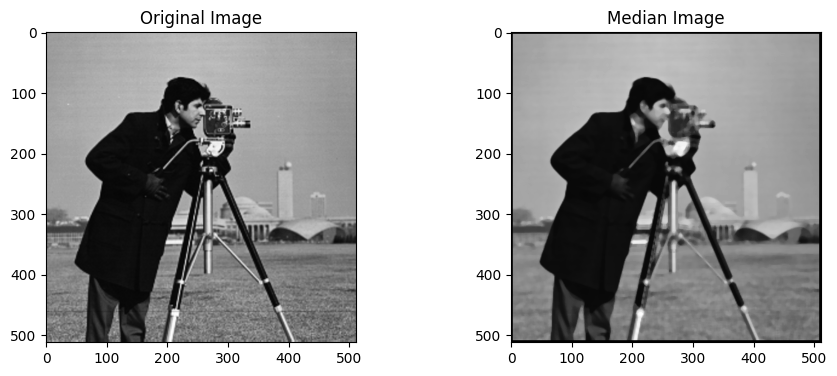

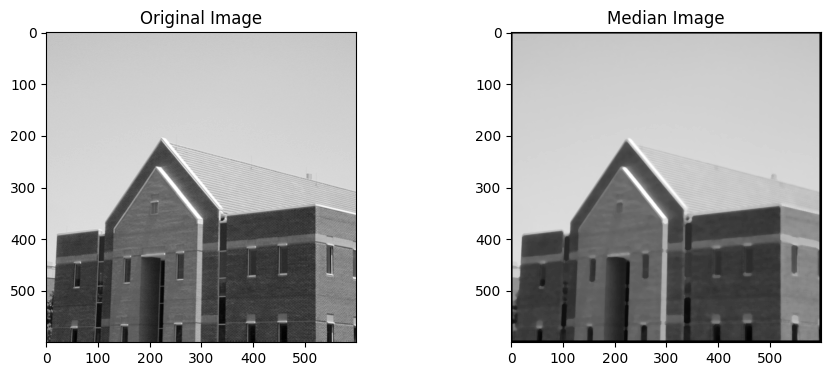

In [ ]:
def show_median(img, g2_im_nd):
    ffig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 2, 1)
    plt2 = plt.subplot(1, 2, 2)
    plt1.title.set_text("Original Image")
    plt2.title.set_text("Median Image")
    plt.subplots_adjust(wspace=0.5)
    
    plt1.imshow(img, cmap="gray")
    plt2.imshow(g2_im_nd, cmap="gray")

def median(img):
    g_im_nd = np.zeros(img.shape)
    
    # Neighborhood opperation (Operação por vizinhança)
    lines = img.shape[0]
    columns = img.shape[1]
    kernel_size = 3 
    
    for x in range(kernel_size, lines - kernel_size):
        for y in range(kernel_size, columns - kernel_size):
            s_xy =img[x-kernel_size:x+kernel_size+1, y-kernel_size:y+kernel_size+1]
            g_im_nd[x,y] = np.median(s_xy).astype(int)
    
    # Create two colums plot
    show_median(img, g_im_nd)
    
median(lena.copy())

median(cam.copy())

median(house.copy())
    

#### 2.2 Pillow

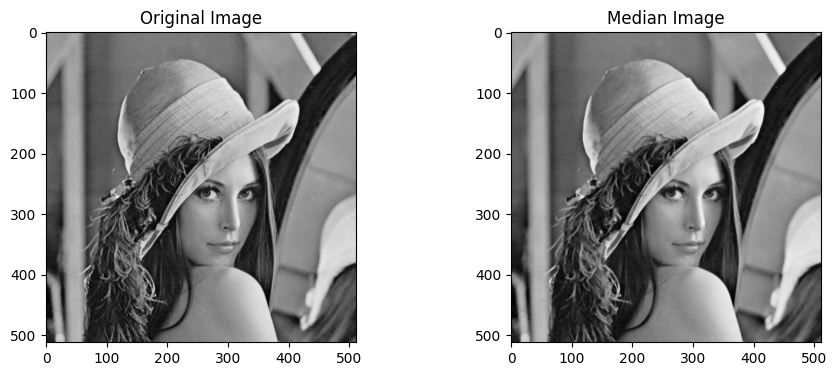

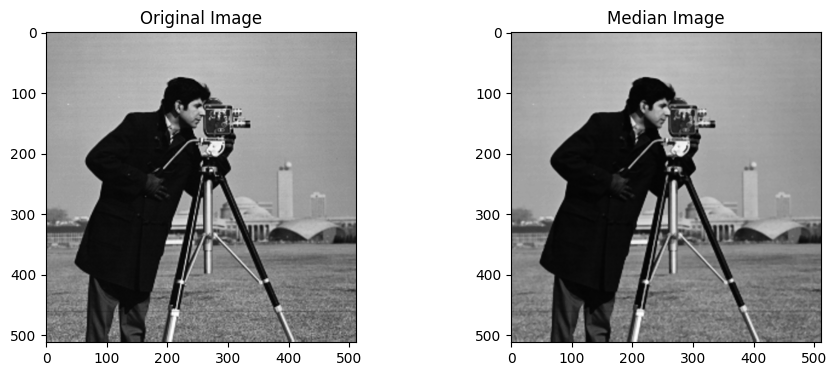

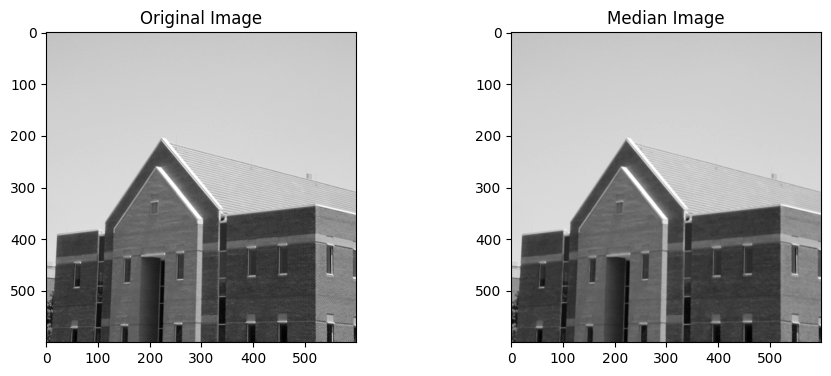

In [ ]:
lena_mean = lena_img.copy()
lena_mean = lena_mean.filter(ImageFilter.MedianFilter(size=3))

cam_mean = cam_img.copy()
cam_mean = cam_mean.filter(ImageFilter.MedianFilter(size=3))

house_mean = house_img.copy()
house_mean = house_mean.filter(ImageFilter.MedianFilter(size=3))

show_median(lena_img, lena_mean)
show_median(cam_img, cam_mean)
show_median(house_img, house_mean)

#### 2.3 OpenCv

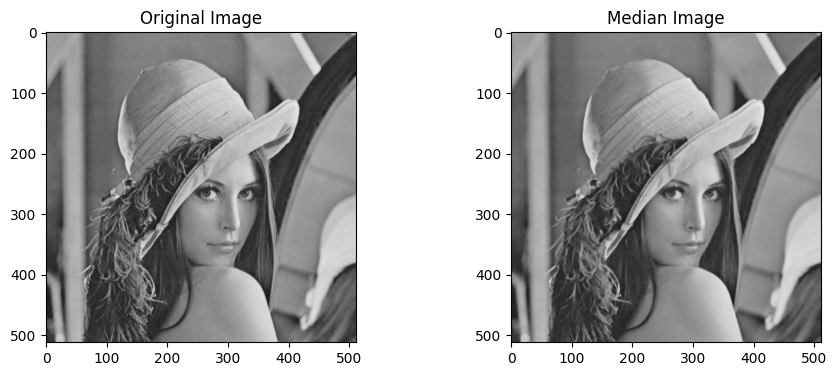

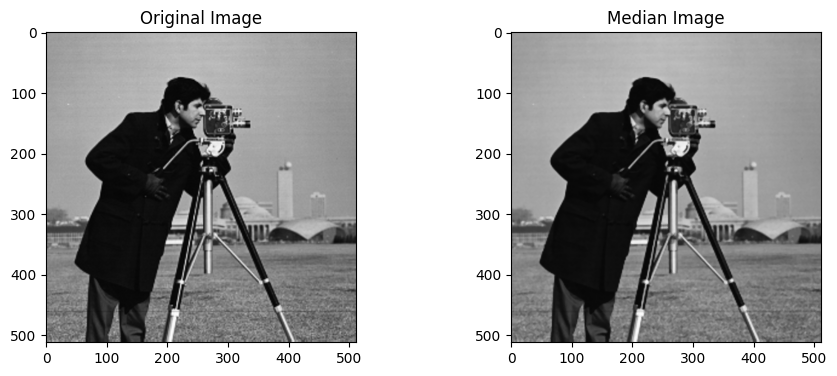

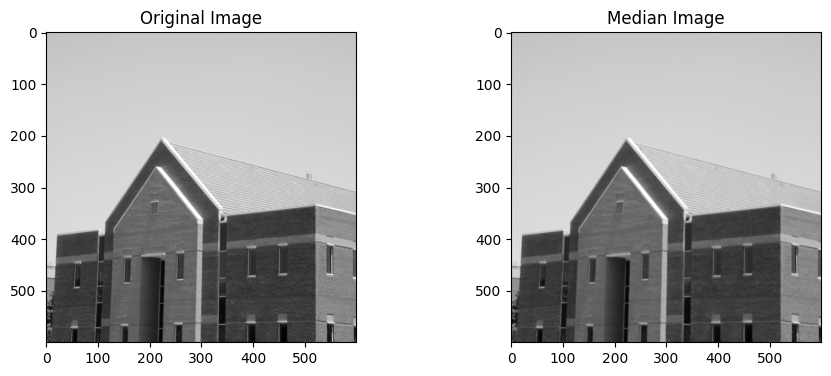

In [ ]:
lena_mean = lena_cv.copy()
lena_mean = cv2.medianBlur(lena_mean, 3)

cam_mean = cam_cv.copy()
cam_mean = cv2.medianBlur(cam_mean, 3)

house_mean = house_cv.copy()
house_mean = cv2.medianBlur(house_mean, 3)

show_median(lena_cv, lena_mean)
show_median(cam_cv, cam_mean)
show_median(house_cv, house_mean)

#### 2.4 Scipy

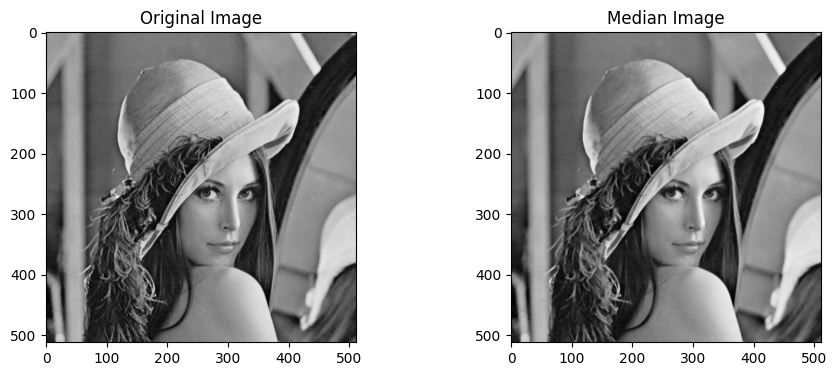

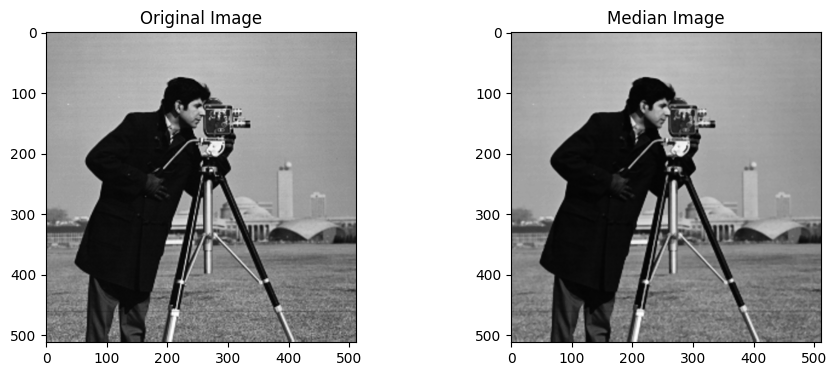

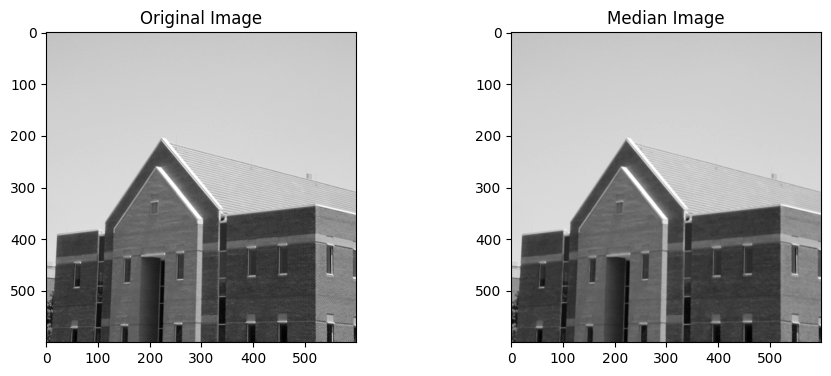

In [ ]:
lena_mean = ndimage.median_filter(lena, size=3)

cam_mean = ndimage.median_filter(cam, size=3)

house_mean = ndimage.median_filter(house, size=3)

show_median(lena, lena_mean)
show_median(cam, cam_mean)
show_median(house, house_mean)

## TRANSFORMAÇÕES GEOMÉTRICAS: Para cada filtro implementar utilizando apenas numpy, utilizando pillow, utilizando opencv e utilizando scipy.

### 1. Escala: Redução em 1.5x e aumentar em 2.5x

#### 1.1 Numpy

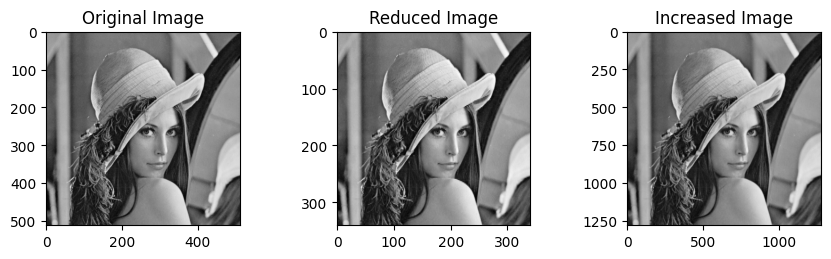

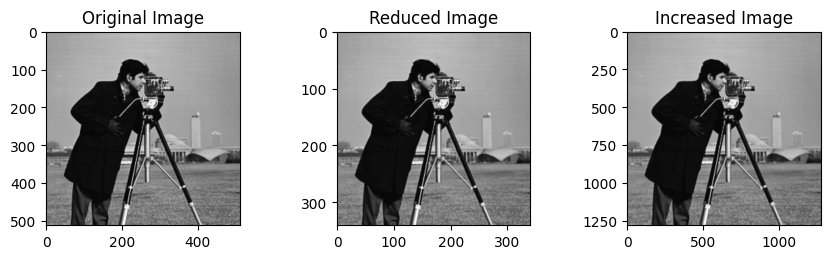

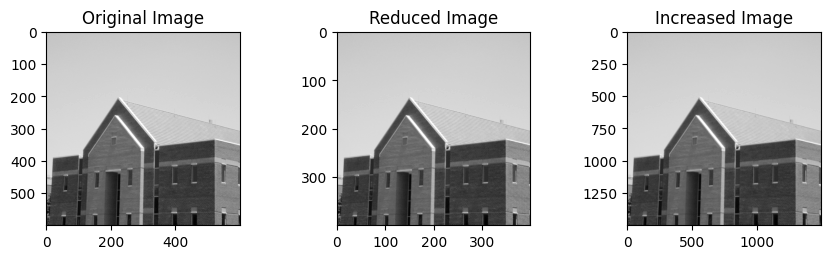

In [ ]:
def show_resize(original, reduced, increased):
    fig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 3, 1)
    plt2 = plt.subplot(1, 3, 2)
    plt3 = plt.subplot(1, 3, 3)
    plt1.title.set_text("Original Image")
    plt2.title.set_text("Reduced Image")
    plt3.title.set_text("Increased Image")
    plt.subplots_adjust(wspace=0.5)

    plt1.imshow(original, cmap="gray")
    plt2.imshow(reduced, cmap="gray")
    plt3.imshow(increased, cmap="gray")
    

def resize_linear(image_matrix, new_height:int, new_width:int):
    output_image = np.zeros((new_height, new_width), dtype=image_matrix.dtype)
    original_height, original_width = image_matrix.shape
    inv_scale_factor_y = original_height/new_height
    inv_scale_factor_x = original_width/new_width

    for new_y in range(new_height):
        for new_x in range(new_width):
            # Find sub-pixels data:
            old_x = new_x * inv_scale_factor_x
            old_y = new_y * inv_scale_factor_y
            x_fraction = old_x - math.floor(old_x)
            y_fraction = old_y - math.floor(old_y)

            # Sample four neighboring pixels:
            left_upper = image_matrix[math.floor(old_y), math.floor(old_x)]
            right_upper = image_matrix[math.floor(old_y), min(image_matrix.shape[1] - 1, math.ceil(old_x))]
            left_lower = image_matrix[min(image_matrix.shape[0] - 1, math.ceil(old_y)), math.floor(old_x)]
            right_lower = image_matrix[min(image_matrix.shape[0] - 1, math.ceil(old_y)), min(image_matrix.shape[1] - 1, math.ceil(old_x))]

            # Interpolate horizontally:
            blend_top = (right_upper * x_fraction) + (left_upper * (1.0 - x_fraction))
            blend_bottom = (right_lower * x_fraction) + (left_lower * (1.0 - x_fraction))
            # Interpolate vertically:
            final_blend = (blend_top * y_fraction) + (blend_bottom * (1.0 - y_fraction))
            output_image[new_y, new_x] = final_blend

    return output_image

width, height = lena.shape
lena_reduced = resize_linear(lena, int(width*(1/1.5)), int(height*(1/1.5)))
lena_incresed = resize_linear(lena, int(width*2.5), int(height*2.5))
show_resize(lena, lena_reduced, lena_incresed)

width, height = cam.shape
cam_reduced = resize_linear(cam, int(width*(1/1.5)), int(height*(1/1.5)))
cam_incresed = resize_linear(cam, int(width*2.5), int(height*2.5))
show_resize(cam, cam_reduced, cam_incresed)

width, height = house.shape
house_reduced = resize_linear(house, int(width*(1/1.5)), int(height*(1/1.5)))
house_incresed = resize_linear(house, int(width*2.5), int(height*2.5))
show_resize(house, house_reduced, house_incresed)


#### 1.2 Pillow

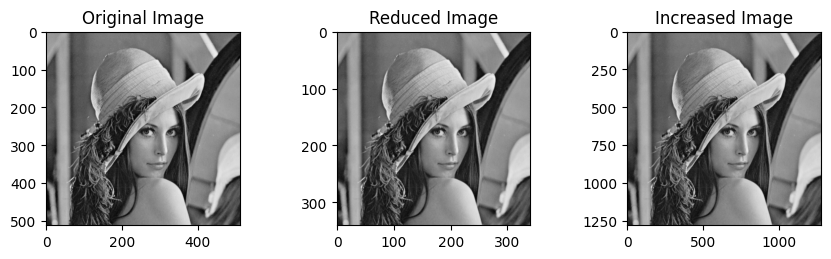

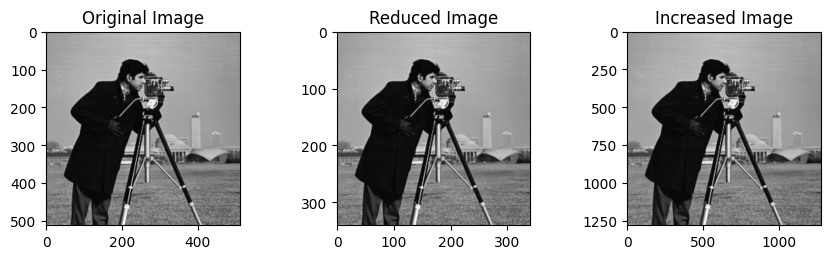

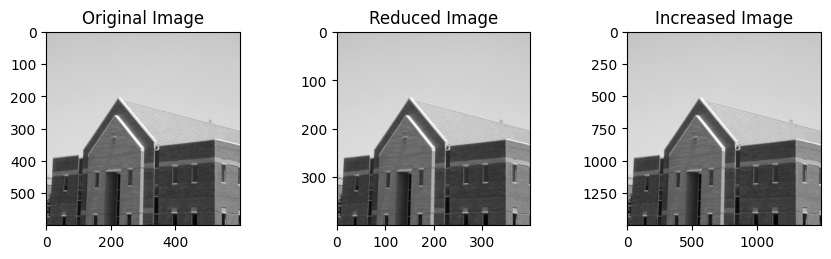

In [ ]:

lena_reduced = ImageOps.scale(lena_img, (1/1.5))
lena_incresed = ImageOps.scale(lena_img, 2.5)
show_resize(lena, lena_reduced, lena_incresed)

cam_reduced = ImageOps.scale(cam_img, (1/1.5))
cam_incresed = ImageOps.scale(cam_img, 2.5)
show_resize(cam, cam_reduced, cam_incresed)

house_reduced = ImageOps.scale(house_img, (1/1.5))
house_incresed = ImageOps.scale(house_img,2.5)
show_resize(house, house_reduced, house_incresed)

#### 1.3 OpenCv

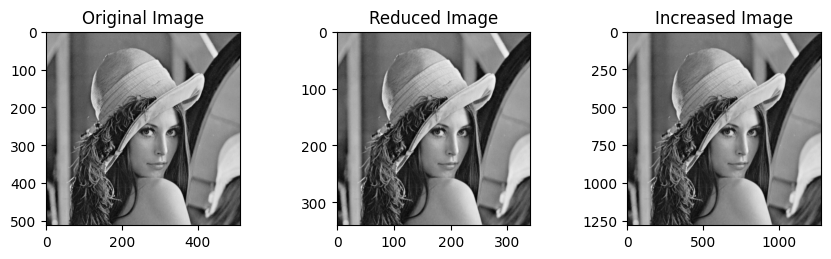

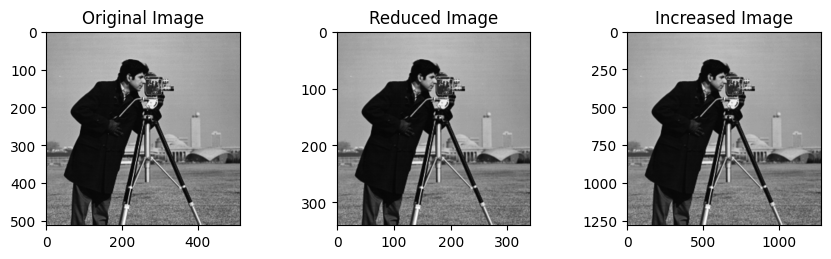

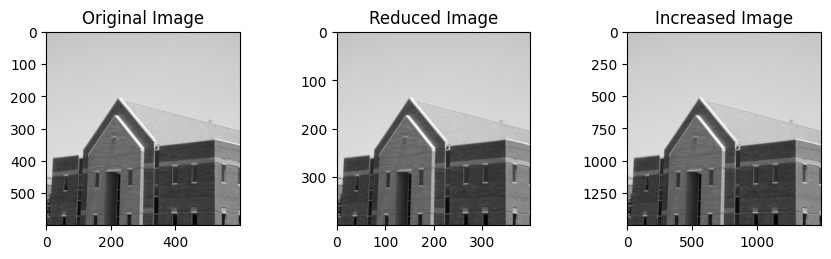

In [ ]:
lena_reduced = cv2.resize(lena, None, fx=(1/1.5), fy=(1/1.5), interpolation= cv2.INTER_LINEAR)
lena_incresed = cv2.resize(lena, None, fx= 2.5, fy= 2.5, interpolation= cv2.INTER_LINEAR)
show_resize(lena, lena_reduced, lena_incresed)

cam_reduced = cv2.resize(cam, None, fx=(1/1.5), fy= (1/1.5), interpolation= cv2.INTER_LINEAR)
cam_incresed = cv2.resize(cam, None, fx= 2.5, fy= 2.5, interpolation= cv2.INTER_LINEAR)
show_resize(cam, cam_reduced, cam_incresed)

house_reduced = cv2.resize(house, None, fx=(1/1.5), fy=(1/1.5), interpolation= cv2.INTER_LINEAR)
house_incresed = cv2.resize(house, None, fx= 2.5, fy= 2.5, interpolation= cv2.INTER_LINEAR)
show_resize(house, house_reduced, house_incresed)


#### 1.4 Scipy


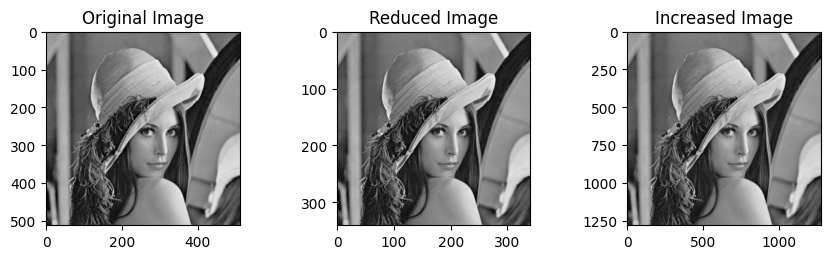

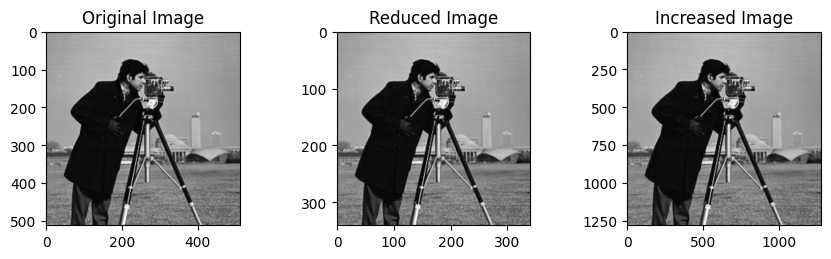

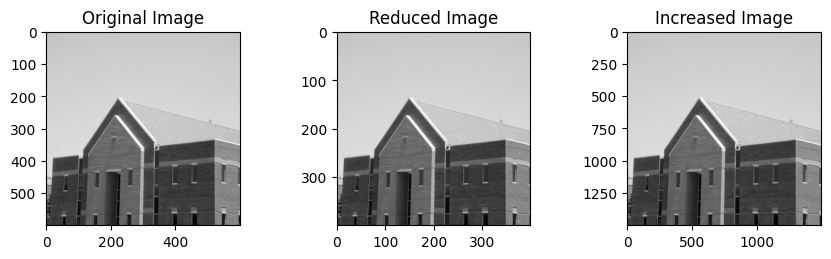

In [ ]:
lenaChangeSize = lena.copy()
lenaZoom = ndimage.zoom(lenaChangeSize, (2.5, 2.5))
lenaShrink = ndimage.zoom(lenaChangeSize, (1/1.5, 1/1.5))
show_resize(lena, lenaShrink, lenaZoom)

camChangeSize = cam.copy()
camZoom = ndimage.zoom(camChangeSize, (2.5, 2.5))
camShrink = ndimage.zoom(camChangeSize, (1/1.5, 1/1.5))
show_resize(cam, camShrink, camZoom)

houseChangeSize = house.copy()
houseZoom = ndimage.zoom(houseChangeSize, (2.5, 2.5))
houseShrink = ndimage.zoom(houseChangeSize, (1/1.5, 1/1.5))
show_resize(house, houseShrink, houseZoom)



### 2. Rotação em 45º, 90º e 100º

#### 2.1 Numpy

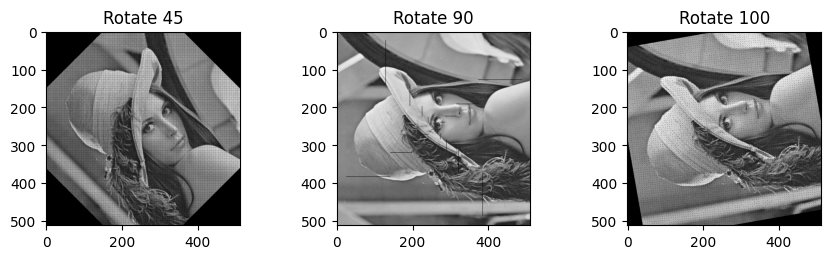

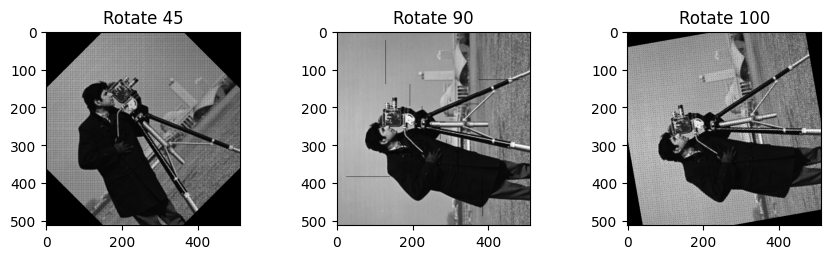

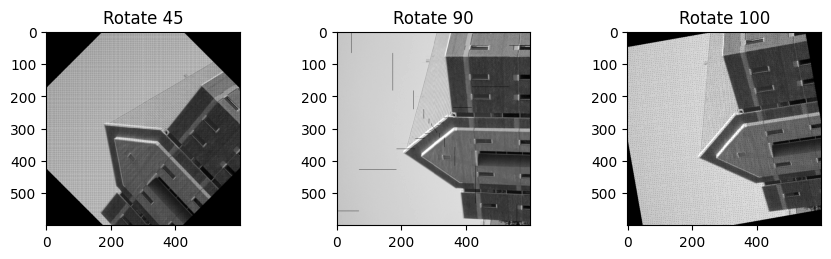

In [ ]:
def show_rotated_img(img45, img90, img100):
    fig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 3, 1)
    plt2 = plt.subplot(1, 3, 2)
    plt3 = plt.subplot(1, 3, 3)
    plt1.title.set_text("Rotate 45")
    plt2.title.set_text("Rotate 90")
    plt3.title.set_text("Rotate 100")

    plt1.imshow(img45, cmap="gray")
    plt2.imshow(img90, cmap="gray")
    plt3.imshow(img100, cmap="gray")
    plt.subplots_adjust(wspace=0.5)

def rotate(src_img, angle_of_rotation,pivot_point, shape_img):
    #1.create rotation matrix with numpy array
    rotation_mat = np.transpose(np.array([[np.cos(angle_of_rotation),-np.sin(angle_of_rotation)],
                                          [np.sin(angle_of_rotation),np.cos(angle_of_rotation)]]))
    h,w = shape_img
    pivot_point_x = pivot_point[0]
    pivot_point_y = pivot_point[1]
    
    
    new_img = np.zeros(src_img.shape, dtype= 'u1')
                       
    for height in range(h): 
        for width in range(w): 
            xy_mat = np.array([[width-pivot_point_x],[height-pivot_point_y]])
            rotate_mat = np.dot (rotation_mat, xy_mat)
            new_x = pivot_point_x + int(rotate_mat[0])
            new_y = pivot_point_y + int(rotate_mat[1])
    
            if (0 <= new_x <= w-1) and (0 <= new_y <= h-1):
                new_img[new_y,new_x] = src_img[height,width]
        
    return new_img

def change_angle_to_radius_unit(angle):
    angle_radius = angle * (np.pi/180)
    return angle_radius

width, height = lena.shape
lenaRotat = lena.copy()
lena_np_rotate_45  = rotate(lenaRotat, change_angle_to_radius_unit(45), (int(height/2), int(width/2)), (height, width))
lena_np_rotate_90  = rotate(lenaRotat, change_angle_to_radius_unit(90), (int(height/2), int(width/2)), (height, width))
lena_np_rotate_100  = rotate(lenaRotat, change_angle_to_radius_unit(100), (int(height/2), int(width/2)), (height, width))
show_rotated_img(lena_np_rotate_45, lena_np_rotate_90, lena_np_rotate_100)

width, height = cam.shape
camRotat = cam.copy()
cam_np_rotate_45  = rotate(camRotat, change_angle_to_radius_unit(45), (int(height/2), int(width/2)), (height, width))
cam_np_rotate_90  = rotate(camRotat, change_angle_to_radius_unit(90), (int(height/2), int(width/2)), (height, width))
cam_np_rotate_100  = rotate(camRotat, change_angle_to_radius_unit(100), (int(height/2), int(width/2)), (height, width))
show_rotated_img(cam_np_rotate_45, cam_np_rotate_90, cam_np_rotate_100)

width, height = house.shape
houseRotat = house.copy()
house_np_rotate_45  = rotate(houseRotat, change_angle_to_radius_unit(45), (int(height/2), int(width/2)), (height, width))
house_np_rotate_90  = rotate(houseRotat, change_angle_to_radius_unit(90), (int(height/2), int(width/2)), (height, width))
house_np_rotate_100  = rotate(houseRotat, change_angle_to_radius_unit(100), (int(height/2), int(width/2)), (height, width))
show_rotated_img(house_np_rotate_45, house_np_rotate_90, house_np_rotate_100)

#### 2.4 Pillow

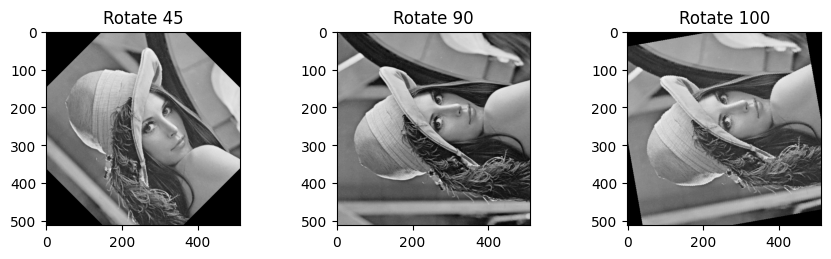

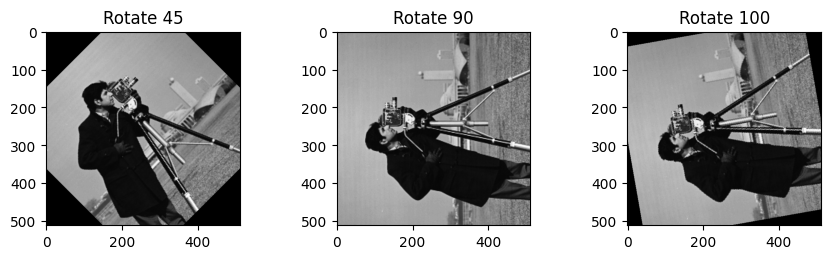

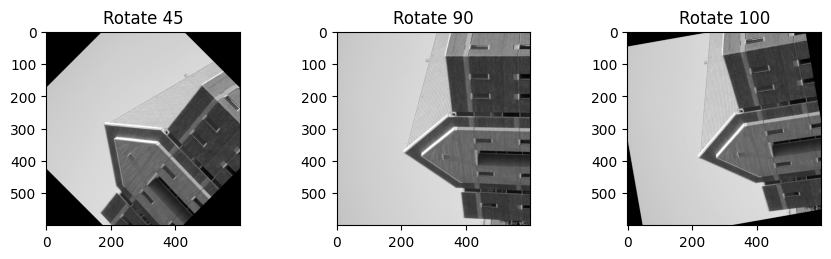

In [ ]:
lenaRotat = lena_img.copy()
lena_np_rotate_45  = lenaRotat.rotate(45)
lena_np_rotate_90  = lenaRotat.rotate(90)
lena_np_rotate_100  = lenaRotat.rotate(100)
show_rotated_img(lena_np_rotate_45, lena_np_rotate_90, lena_np_rotate_100)


camRotat = cam_img.copy()
cam_np_rotate_45  = camRotat.rotate(45)
cam_np_rotate_90  = camRotat.rotate(90)
cam_np_rotate_100  = camRotat.rotate(100)
show_rotated_img(cam_np_rotate_45, cam_np_rotate_90, cam_np_rotate_100)

houseRotat = house_img.copy()
house_np_rotate_45  = houseRotat.rotate(45)
house_np_rotate_90  = houseRotat.rotate(90)
house_np_rotate_100  = houseRotat.rotate(100)
show_rotated_img(house_np_rotate_45, house_np_rotate_90, house_np_rotate_100)

#### 2.3 OpenCv

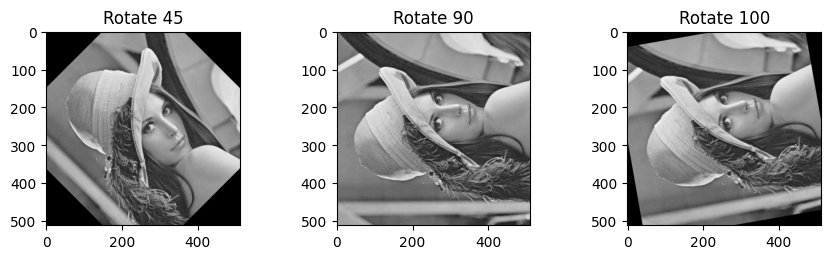

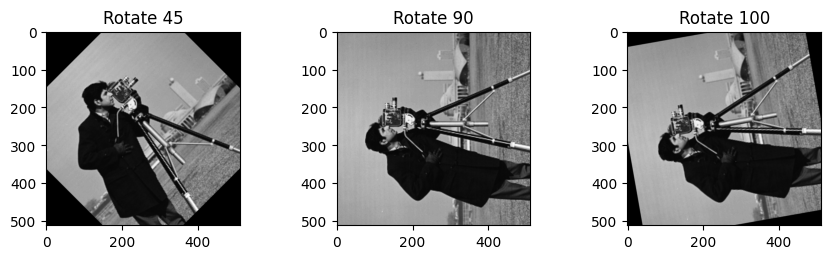

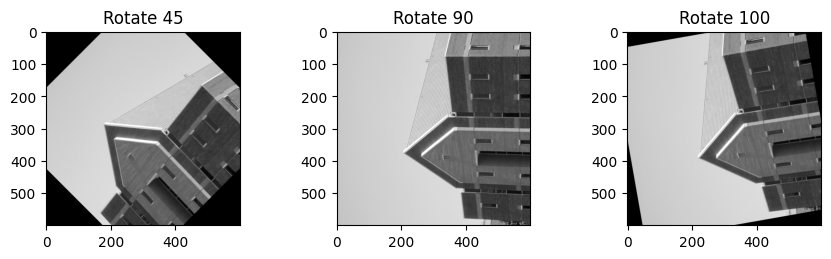

In [ ]:
def rotate(image, angle, center = None, scale = 1.0):
    (h, w) = image.shape[:2]

    if center is None:
        center = (w / 2, h / 2)

    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, scale)
    rotated = cv2.warpAffine(image, M, (w, h))

    return rotated

lena_np_rotate_45  = rotate(lena, 45)
lena_np_rotate_90  = rotate(lena, 90)
lena_np_rotate_100  = rotate(lena, 100)
show_rotated_img(lena_np_rotate_45, lena_np_rotate_90, lena_np_rotate_100)


cam_np_rotate_45  = rotate(cam, 45)
cam_np_rotate_90  = rotate(cam, 90)
cam_np_rotate_100  = rotate(cam, 100)
show_rotated_img(cam_np_rotate_45, cam_np_rotate_90, cam_np_rotate_100)

house_np_rotate_45  = rotate(house, 45)
house_np_rotate_90  = rotate(house, 90)
house_np_rotate_100  = rotate(house, 100)
show_rotated_img(house_np_rotate_45, house_np_rotate_90, house_np_rotate_100)

#### 2.4 Scipy

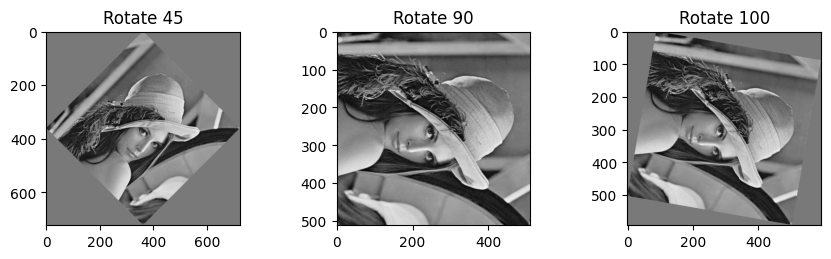

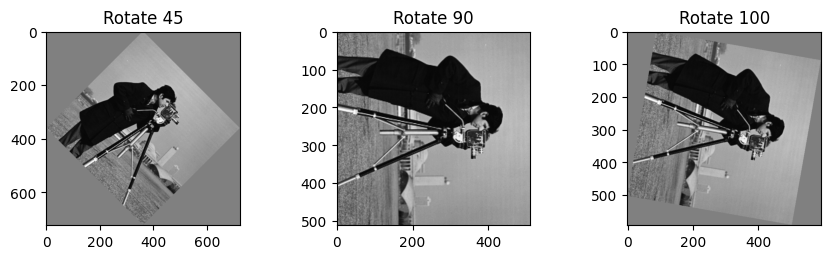

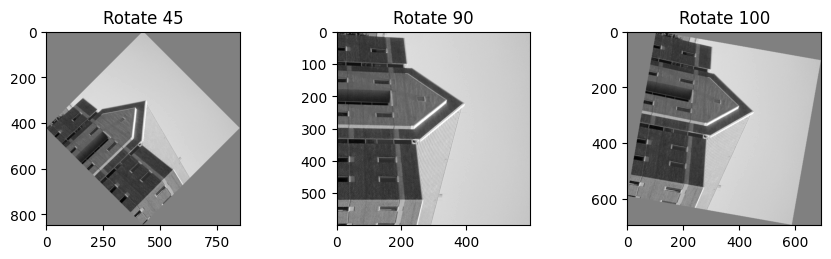

In [ ]:
lenaRotat = lena.copy()
lena_np_rotate_45  = ndimage.rotate(lenaRotat, -45, cval=128)
lena_np_rotate_90  = ndimage.rotate(lenaRotat, -90, cval=128)
lena_np_rotate_100  = ndimage.rotate(lenaRotat, -100, cval=128)
show_rotated_img(lena_np_rotate_45, lena_np_rotate_90, lena_np_rotate_100)


camRotat = cam.copy()
cam_np_rotate_45  = ndimage.rotate(camRotat, -45, cval=128)
cam_np_rotate_90  = ndimage.rotate(camRotat, -90, cval=128)
cam_np_rotate_100  = ndimage.rotate(camRotat, -100, cval=128)
show_rotated_img(cam_np_rotate_45, cam_np_rotate_90, cam_np_rotate_100)

houseRotat = house.copy()
house_np_rotate_45  = ndimage.rotate(houseRotat, -45, cval=128)
house_np_rotate_90  = ndimage.rotate(houseRotat, -90, cval=128)
house_np_rotate_100  = ndimage.rotate(houseRotat, -100, cval=128)
show_rotated_img(house_np_rotate_45, house_np_rotate_90, house_np_rotate_100)

### 3. Translação utilizar os parâmetros que quiser nas coordenadas x e y

#### 3.1 Numpy

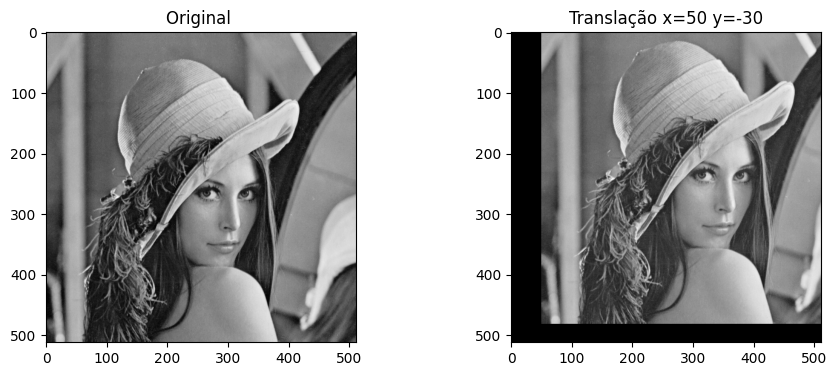

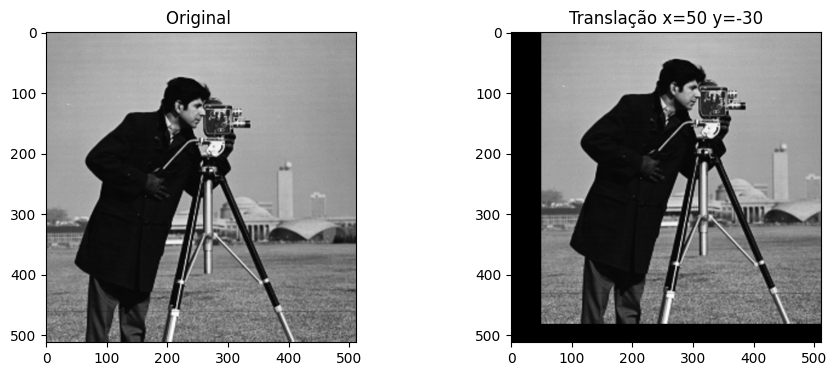

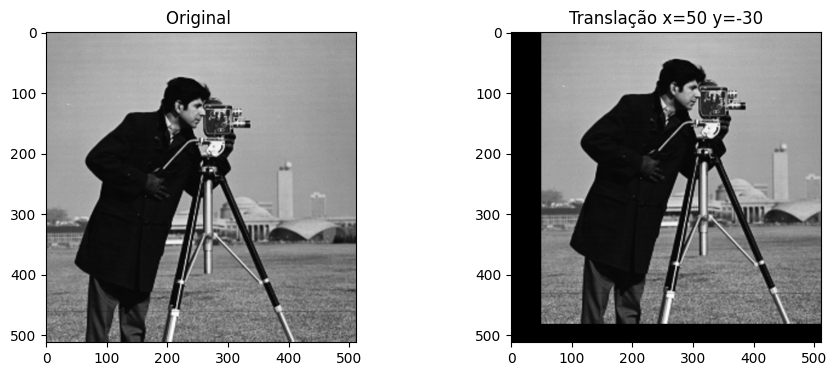

In [ ]:
def show_transl(img, img_transl, x, y):
    fig = plt.figure(figsize=(10, 5))
    plt1 = plt.subplot(1, 2, 1)
    plt2 = plt.subplot(1, 2, 2)
    plt1.title.set_text("Original ")
    plt2.title.set_text(f"Translação x={x} y={y}")
    plt.subplots_adjust(wspace=0.5)

    plt1.imshow(img, cmap="gray")
    plt2.imshow(img_transl, cmap="gray")

def translation_img(src_img,shift_distance,shape_of_out_img):
    h,w = src_img.shape[:2]
    x_distance = shift_distance[0]
    y_distance = shift_distance[1]
    ts_mat = np.array([[1,0,x_distance], [0,1,y_distance]])
    
    out_img = np.zeros(shape_of_out_img,dtype='u1')
    
    for i in range(h): 
        for j in range(w):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x,origin_y,1])
            
            new_xy = np.dot(ts_mat,origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]
            
            
            if 0 < new_x < w and 0 <new_y < h:
                out_img[new_y,new_x] = src_img[i,j]
                
    return out_img

translated_image_lena = translation_img(lena, (50,-30), lena.shape)
show_transl(lena, translated_image_lena, 50, -30)
translated_image_cam = translation_img(cam, (50,-30), cam.shape)
show_transl(cam, translated_image_cam, 50, -30)
translated_image_house = translation_img(house, (50,-30), house.shape)
show_transl(cam, translated_image_cam, 50, -30)


#### 3.4 Pillow

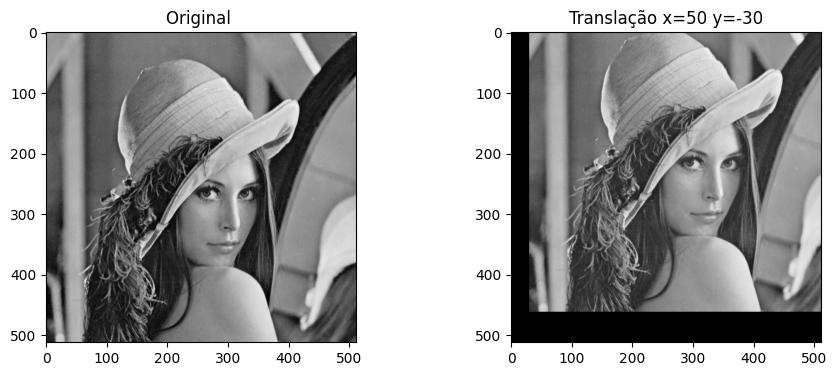

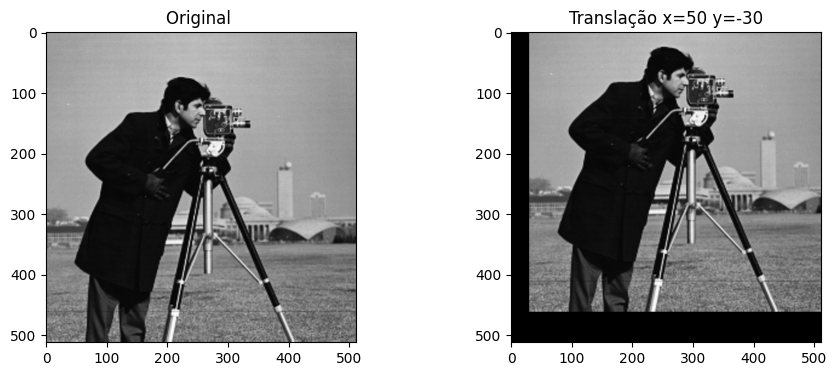

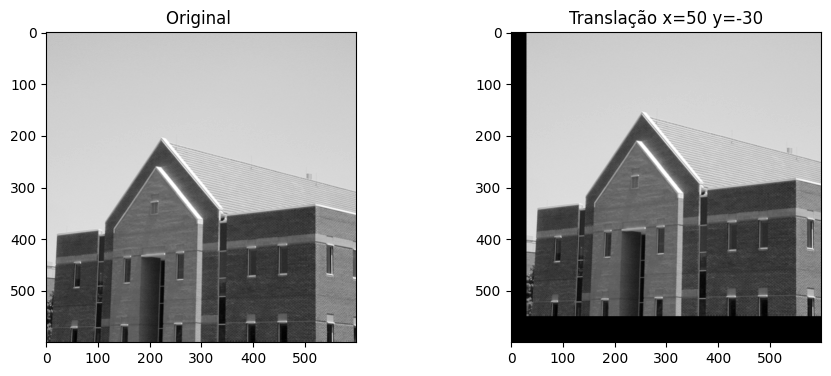

In [ ]:
lenaTransform = lena_img.copy()
lenaTransform  = lenaTransform.transform(lenaTransform.size, Image.AFFINE, (1, 0, -30, 0, 1, 50))
show_transl(lena, lenaTransform, 50, -30)

camTransform = cam_img.copy()
camTransform = camTransform.transform(camTransform.size, Image.AFFINE, (1, 0, -30, 0, 1, 50))
show_transl(cam, camTransform, 50, -30)

houseTransform = house_img.copy()
houseTransform = houseTransform.transform(houseTransform.size, Image.AFFINE, (1, 0,-30, 0, 1, 50))
show_transl(house, houseTransform, 50, -30)

#### 3.3 OpenCv

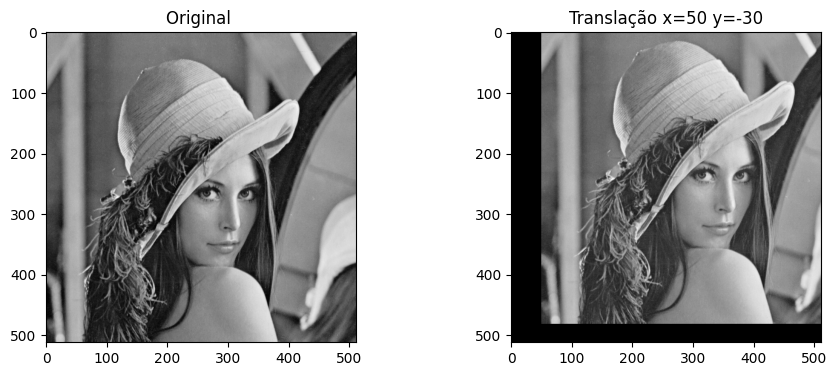

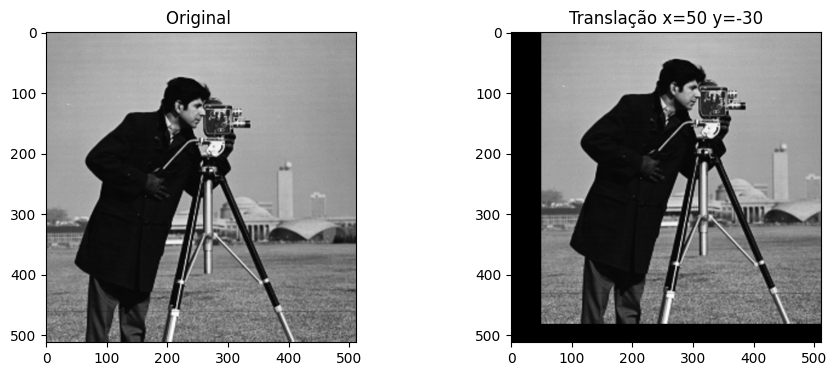

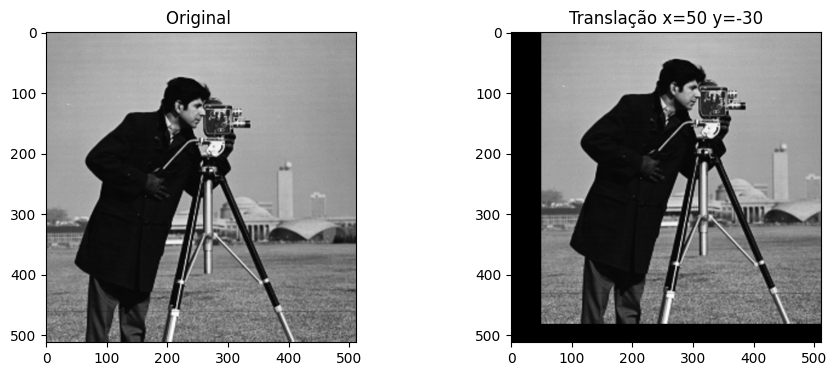

In [ ]:
def translate(image, tx, ty):
    height, width = image.shape[:2]

    # create the translation matrix using tx and ty, it is a NumPy array 
    translation_matrix = np.array([
        [1, 0, tx],
        [0, 1, ty]
    ], dtype=np.float32)
    
    translated_image = cv2.warpAffine(src=image, M=translation_matrix, dsize=(width, height))
    
    return translated_image

translated_image_lena = translate(lena, 50, -30)
show_transl(lena, translated_image_lena, 50, -30)
translated_image_cam = translate(cam, 50, -30)
show_transl(cam, translated_image_cam, 50, -30)
translated_image_house = translate(house, 50, -30)
show_transl(cam, translated_image_cam, 50, -30)


#### 3.4 Scipy

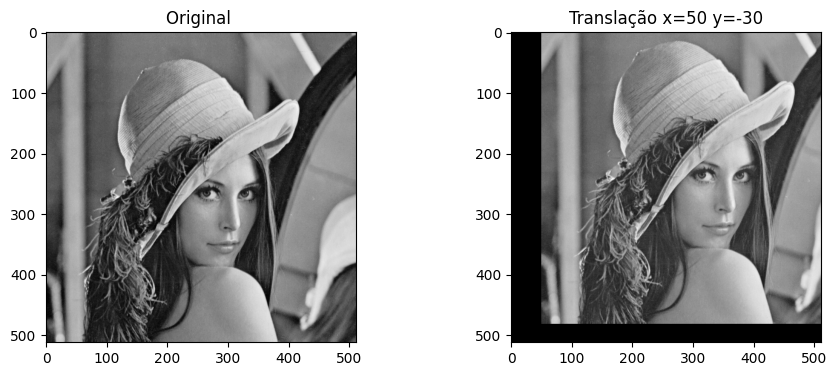

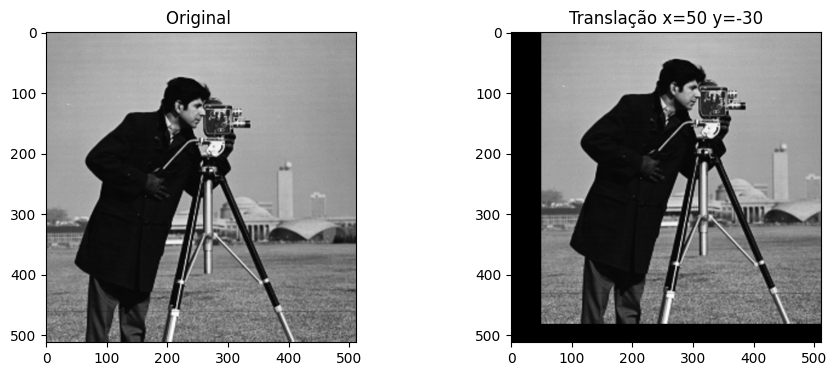

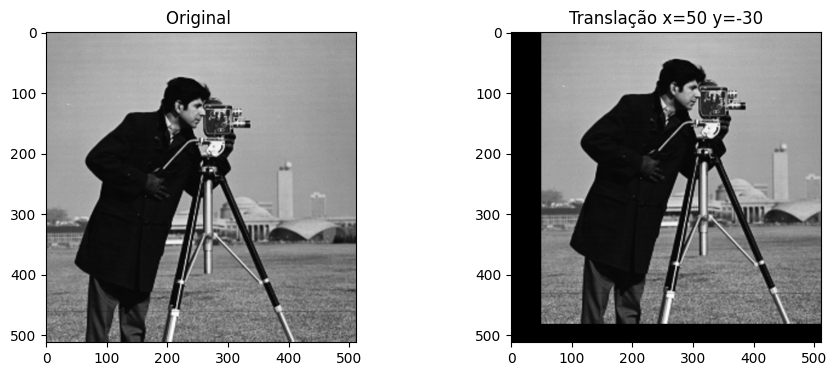

In [ ]:
translLena = lena.copy()
translCam = cam.copy()
translHouse = house.copy()
shift_x = 50  
shift_y = -30
shift_vector = [shift_y, shift_x]

translated_image_lena = ndimage.shift(translLena, shift_vector, mode='constant', cval=0)
show_transl(lena, translated_image_lena, 50, -30)
translated_image_cam = ndimage.shift(translCam , shift_vector, mode='constant', cval=0)
show_transl(cam, translated_image_cam, 50, -30)
translated_image_house = ndimage.shift(translHouse, shift_vector, mode='constant', cval=0)
show_transl(cam, translated_image_cam, 50, -30)


### 4. Translação em 35 pixel no eixo X, 45 eixo Y

#### 4.1 Numpy

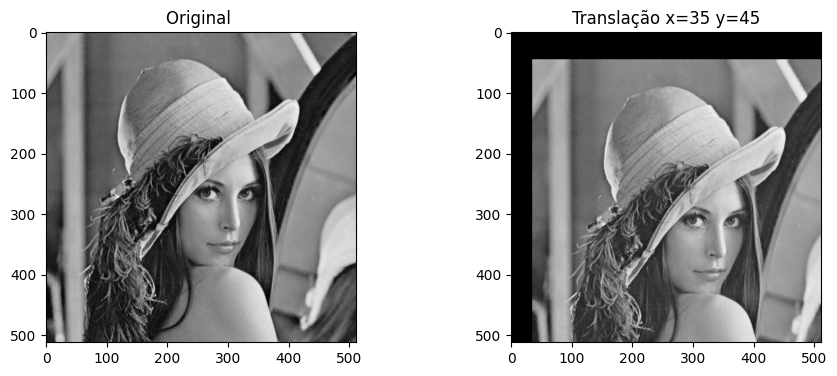

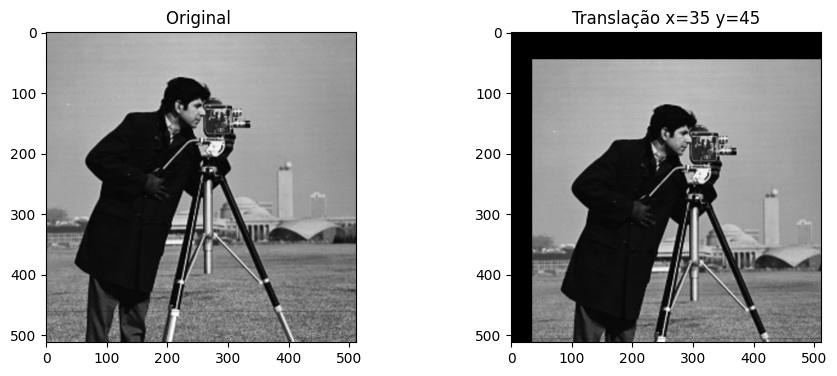

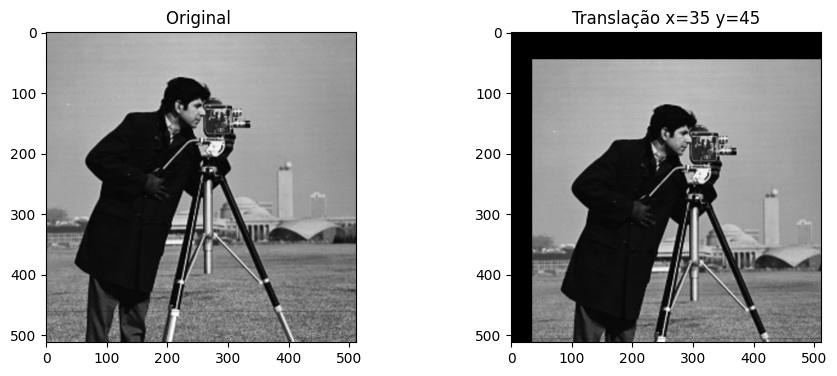

In [ ]:
translated_image_lena = translation_img(lena, (35,45), lena.shape)
show_transl(lena, translated_image_lena, 35, 45)
translated_image_cam = translation_img(cam, (35,45), cam.shape)
show_transl(cam, translated_image_cam, 35, 45)
translated_image_house = translation_img(house, (35,45), house.shape)
show_transl(cam, translated_image_cam, 35, 45)

#### 4.2 Pillow

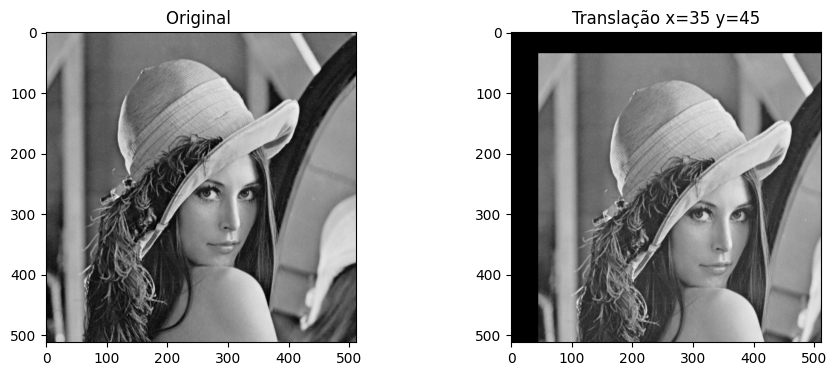

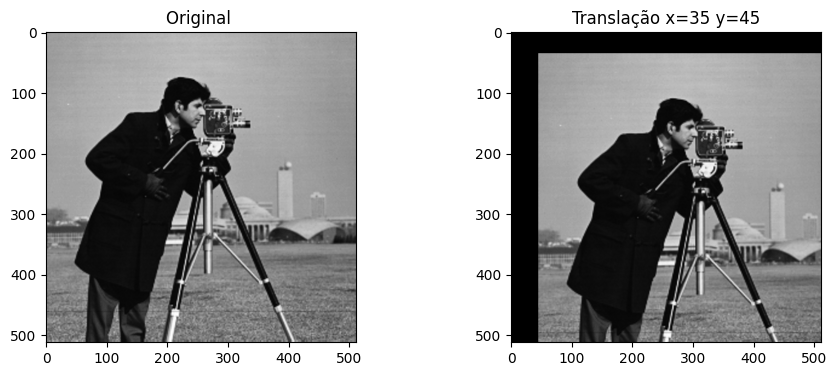

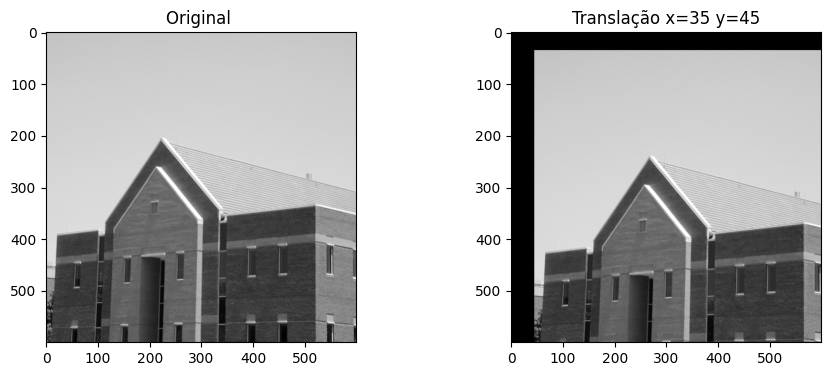

In [ ]:
lenaTransform = lena_img.copy()
lenaTransform  = lenaTransform.transform(lenaTransform.size, Image.AFFINE, (1, 0, -45, 0, 1, -35))
show_transl(lena, lenaTransform, 35, 45)

camTransform = cam_img.copy()
camTransform = camTransform.transform(camTransform.size, Image.AFFINE, (1, 0, -45, 0, 1, -35))
show_transl(cam, camTransform, 35, 45)

houseTransform = house_img.copy()
houseTransform = houseTransform.transform(houseTransform.size, Image.AFFINE, (1, 0, -45, 0, 1, -35))
show_transl(house, houseTransform, 35, 45)

#### 4.3 OpenCv

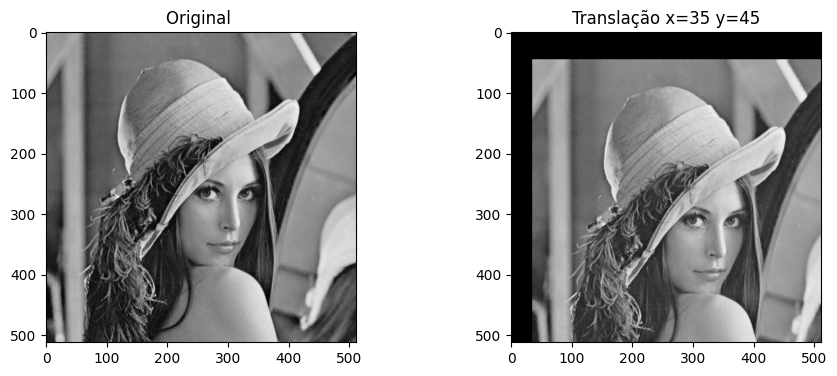

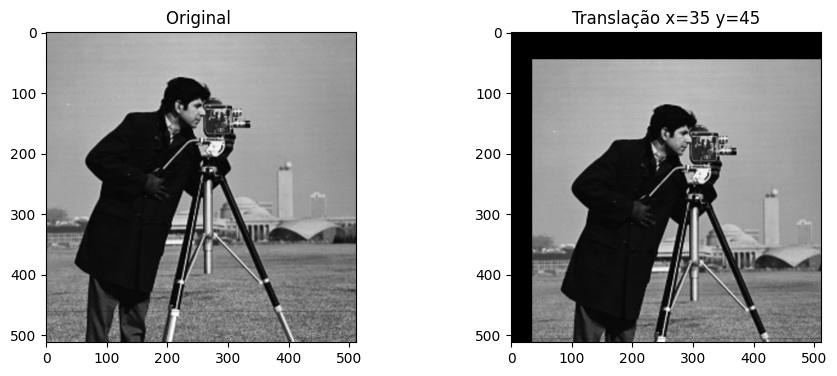

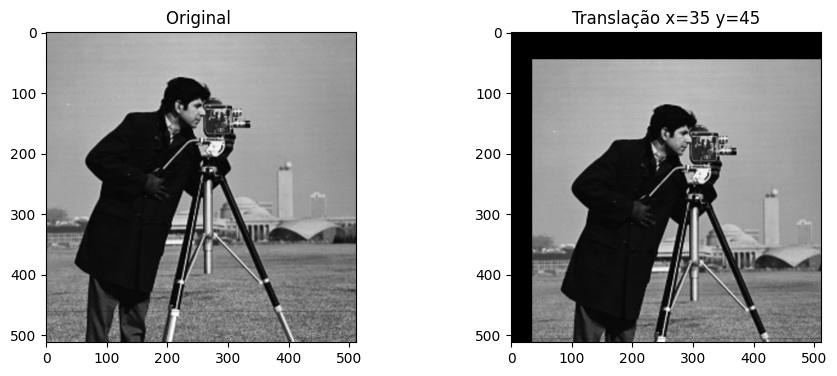

In [ ]:
translated_image_lena = translate(lena, 35, 45)
show_transl(lena, translated_image_lena, 35, 45)
translated_image_cam = translate(cam, 35, 45)
show_transl(cam, translated_image_cam, 35, 45)
translated_image_house = translate(house, 35, 45)
show_transl(cam, translated_image_cam, 35, 45)

#### 4.4 Scipy

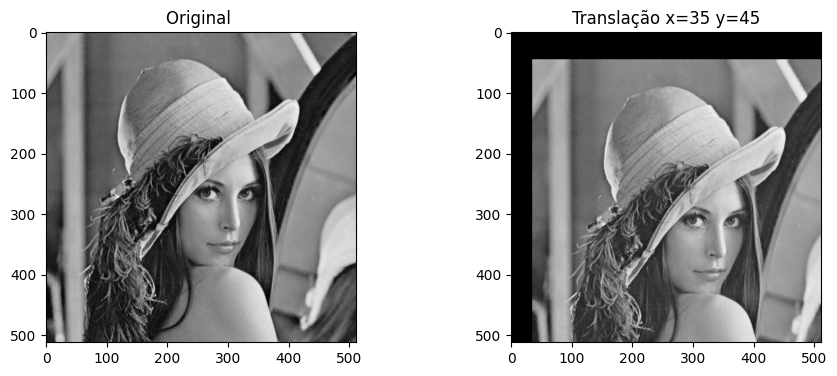

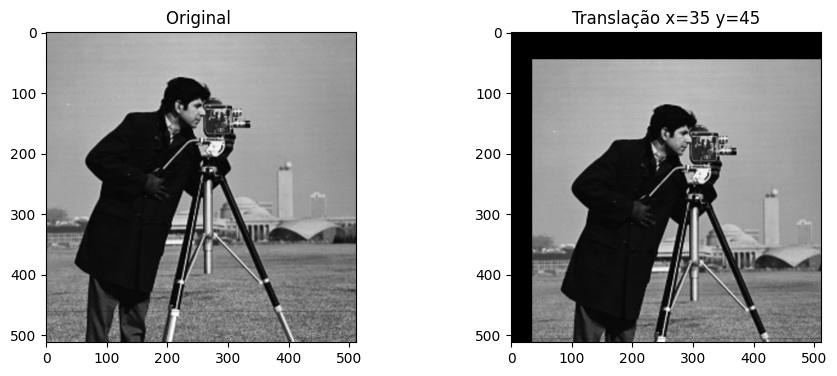

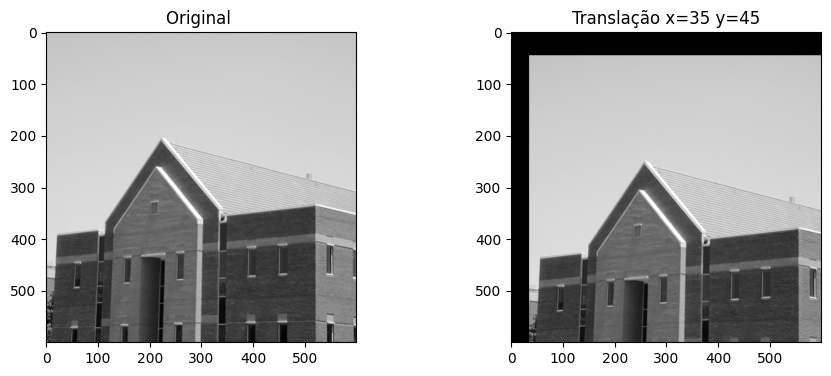

In [ ]:
translLena = lena.copy()
translCam = cam.copy()
translHouse = house.copy()
shift_x = 35 
shift_y = 45
shift_vector = [shift_y, shift_x]

translated_image_lena = ndimage.shift(translLena, shift_vector, mode='constant', cval=0)
show_transl(lena, translated_image_lena, 35, 45)
translated_image_cam = ndimage.shift(translCam , shift_vector, mode='constant', cval=0)
show_transl(cam, translated_image_cam, 35, 45)
translated_image_house = ndimage.shift(translHouse, shift_vector, mode='constant', cval=0)
show_transl(house, translated_image_house, 35, 45)
